<h1 align="center">UST, Zewail City</h1>
<h2 align="center">CIE 555 (Spring 2021)</h2>
<h2 align="center">Lab 8 : Time Series Forecasting</h2>


Based on Tensorflow and Keras tutorials: 

https://www.tensorflow.org/tutorials/structured_data/time_series 

https://keras.io/examples/timeseries/timeseries_weather_forecasting/

#Lab Objectives

* Explore and process the weather time series data
* Understand the basic operations of RNN models and LSTM cells
* Use RNNs for time series forecasting
* Get introduced to the concept of autoregressive models

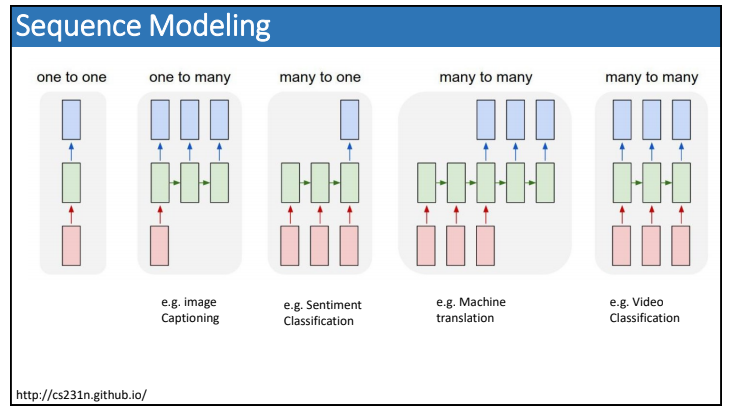

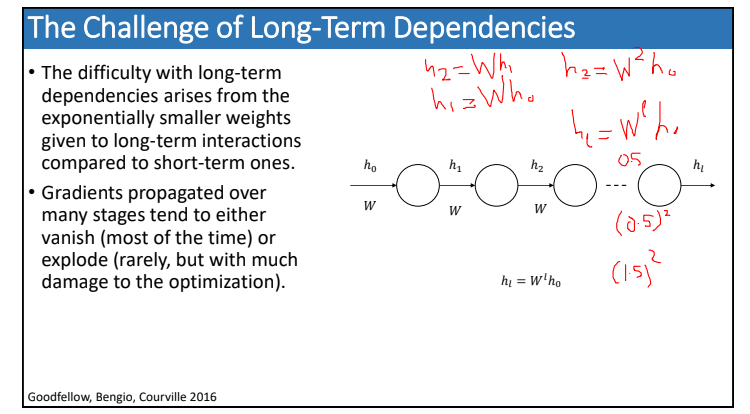

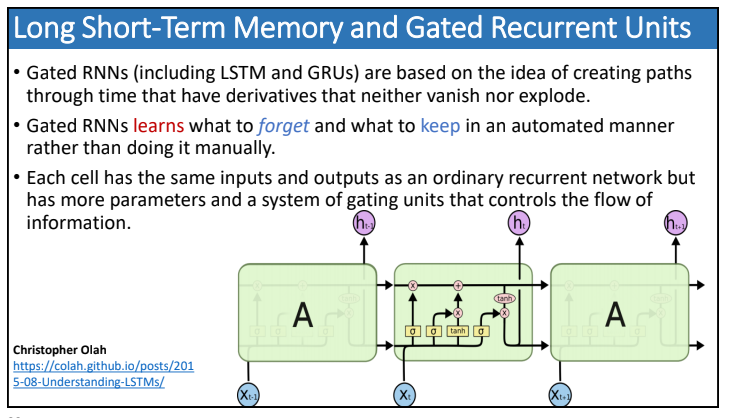

#Installation and Import statements

In [ ]:
!pip install pandas-profiling==2.7.1

In [ ]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pandas_profiling as pp

from tensorflow import keras

from zipfile import ZipFile

#Dataset

* In this lab we will work with the weather forecasting dataset.
* This dataset contains 14 different features such as air temperature, atmospheric pressure, and humidity. 
* These were collected every 10 minutes, beginning in 2003. 
* We will use only the data collected between 2009 and 2016. 

In [ ]:
uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

In [ ]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


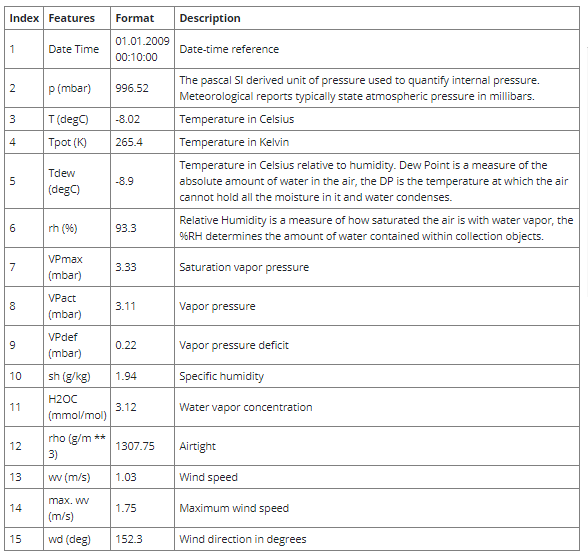

In [ ]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Data Cleaning and Feature Engineering

##Drop some of the highly correlated features

We'll drop the following features: 
* Tpot (K)
* Tdew (degC) 
* rh
* VPact (mbar)
* max. wv (m/s)
* H2OC 

In [ ]:
df= df.drop(columns=['Tpot (K)','Tdew (degC)','rh (%)','VPact (mbar)','max. wv (m/s)', 'H2OC (mmol/mol)'])
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,1.03,152.3
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,0.72,136.1
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,0.19,171.6
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,0.34,198.0
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,0.32,214.3


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,1.702224,65.446714,-9999.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Velocity Min Value

One thing that should stand out is the min value of the wind velocity, wv (m/s) column. This -9999 is likely erroneous. There's a separate wind direction column, so the velocity should be >=0. Replace it with zeros:

In [ ]:
bad_wv = df['wv (m/s)'] == -9999.0
df['wv (m/s)'][bad_wv] = 0.0
df.describe().transpose()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,2.130191,1.542334,0.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Direction

The last column of the data, wd (deg), gives the wind direction in units of degrees. Angles do not make good model inputs, 360° and 0° should be close to each other, and wrap around smoothly. It will be easier for the model to interpret if you convert the wind direction and velocity columns to a wind vector:
 

In [ ]:
wv = df.pop('wv (m/s)')

# Convert to radians.
wd_rad = df.pop('wd (deg)')*np.pi/180

# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


In [ ]:

features= df.drop(columns='Date Time')
features.index=df['Date Time']
features.head()

,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
Date Time,,,,,,,,
01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


##Split the data

* Label column name: ['T (degC)']
 
* Here we are picking ~300,000 data points for training. Observation is recorded every 10 mins, that means 6 times per hour. We will resample one point per hour since no drastic change is expected within 60 minutes. We do this via the sampling_rate argument in timeseries_dataset_from_array utility.

* We are tracking data from past 36 timestamps (36/6=6 hours). This data will be used to predict the temperature after 6 timestamps (6/6=1 hour).

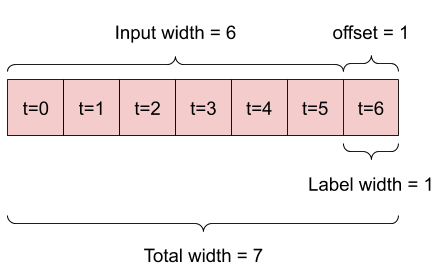

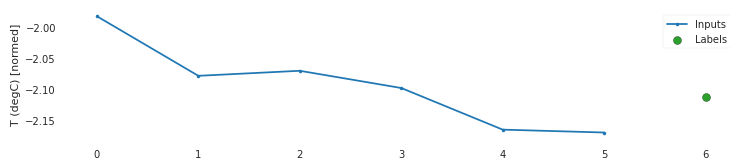

For example, to make a single prediction 24h into the future, given 24h of history you might define a window like this:

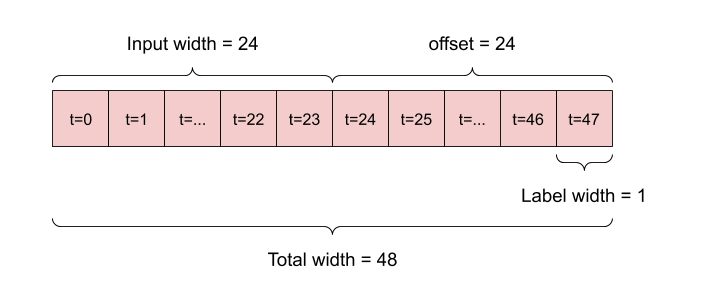

In [ ]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

In [ ]:
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
print("Train split: ", train_split)
step = 6
past = 36
future = 6
learning_rate = 0.001
batch_size = 256
epochs = 10

features = normalize(features.values, train_split)
features = pd.DataFrame(features)
features.head()

Train split:  300693


,0,1,2,3,4,5,6,7
0,0.955451,-2.000020,-1.319782,-0.788479,-1.500927,2.237658,-0.160517,0.560861
1,0.961528,-2.045185,-1.332806,-0.790561,-1.519521,2.287838,0.035423,0.574009
2,0.956666,-2.056766,-1.335410,-0.792642,-1.523239,2.298608,0.200303,0.271053
3,0.954236,-2.033604,-1.328898,-0.794724,-1.508364,2.272906,0.132824,0.185709
4,0.954236,-2.028972,-1.327596,-0.794724,-1.508364,2.268256,0.162232,0.137350


In [ ]:
train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)

Train data shape:  (300693, 8)
Validation data shape:  (119858, 8)


In [ ]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  42
End=  300735
(300693, 8)
(300693, 1)
Sequence length=  6


The timeseries_dataset_from_array function takes in a sequence of data-points gathered at equal intervals, along with time series parameters such as length of the sequences/windows, spacing between two sequence/windows, etc., to produce batches of sub-timeseries inputs and targets sampled from the main timeseries.

**tf.keras.preprocessing.timeseries_dataset_from_array(
    data, targets, sequence_length, sampling_rate=1,
    batch_size=128, shuffle=False, seed=None, start_index=None, end_index=None
)**



* data:	Numpy array or eager tensor containing consecutive data points (timesteps). Axis 0 is expected to be the time dimension.
* targets:	Targets corresponding to timesteps in data. It should have same length as data. targets[i] should be the target corresponding to the window that starts at index i 
* sequence_length	Length of the output sequences (in number of timesteps).

In [ ]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

##Validation data

We'll exclude the last 6 hours from the validation data because we don't have a label for them

In [ ]:
x_end = len(val_data) - past - future

label_start = train_split + past + future

x_val = val_data.iloc[:x_end].values
y_val = features.iloc[label_start:][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 6, 8)
Target shape: (256, 1)


#Training

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 6, 8)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 32)                5248      
_________________________________________________________________
dense (Dense)                (None, 1)                 33        
Total params: 5,281
Trainable params: 5,281
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
1175/1175 [==============================] - 62s 51ms/step - loss: 0.2785 - val_loss: 0.0666

Epoch 00001: val_loss improved from inf to 0.06664, saving model to model_checkpoint.h5
Epoch 2/10
1175/1175 [==============================] - 61s 52ms/step - loss: 0.0497 - val_loss: 0.0539

Epoch 00002: val_loss improved from 0.06664 to 0.05392, saving model to model_checkpoint.h5
Epoch 3/10
1175/1175 [==============================] - 61s 52ms/step - loss: 0.0377 - val_loss: 0.0450

Epoch 00003: val_loss improved from 0.05392 to 0.04498, saving model to model_checkpoint.h5
Epoch 4/10
1175/1175 [==============================] - 61s 52ms/step - loss: 0.0312 - val_loss: 0.0413

Epoch 00004: val_loss improved from 0.04498 to 0.04128, saving model to model_checkpoint.h5
Epoch 5/10
1175/1175 [==============================] - 60s 51ms/step - loss: 0.0278 - val_loss: 0.0398

Epoch 00005: val_loss improved from 0.04128 to 0.03979, saving model to model_checkpoint.h5
Epoch 6/10
1175/117

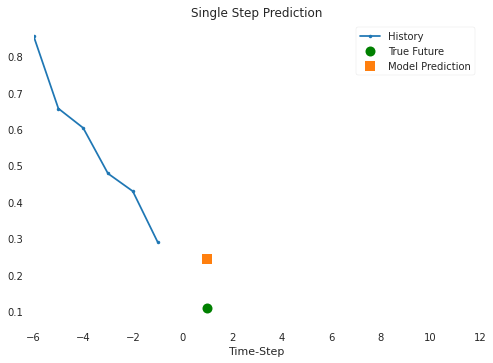

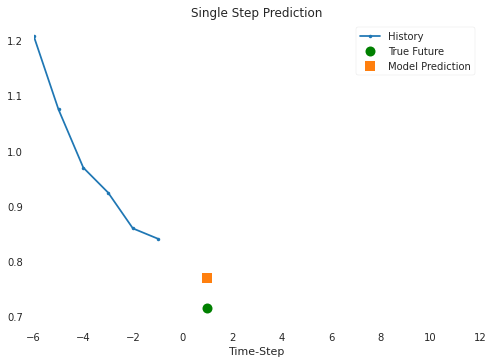

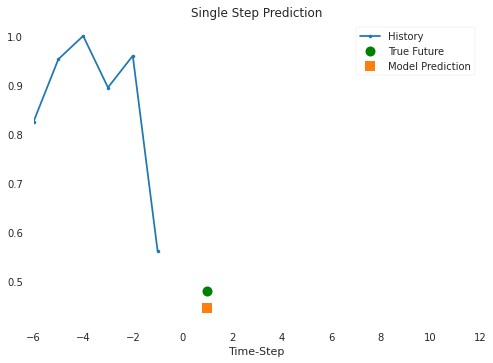

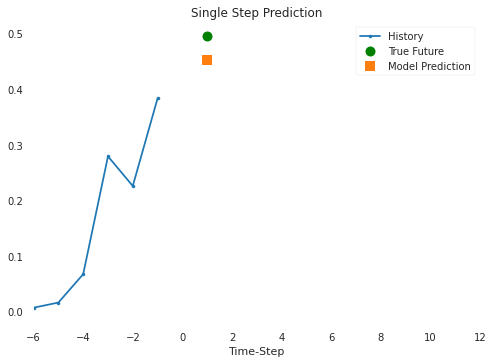

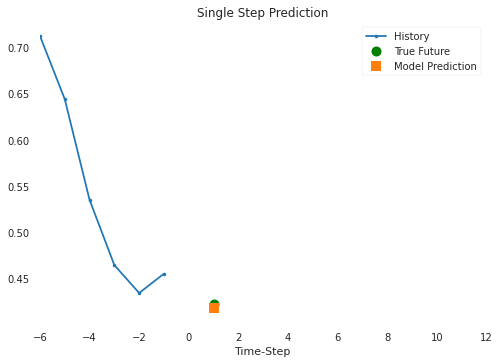

In [ ]:
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

#multi-step prediction with Autoregressive models

In a multi-step prediction, the model needs to learn to predict a range of future values. Thus, unlike a single step model, where only a single future point is predicted, a multi-step model predicts a sequence of the future values.

There are two rough approaches to this:

Single shot predictions where the entire time series is predicted at once.
Autoregressive predictions where the model only makes single step predictions and its output is fed back as its input.

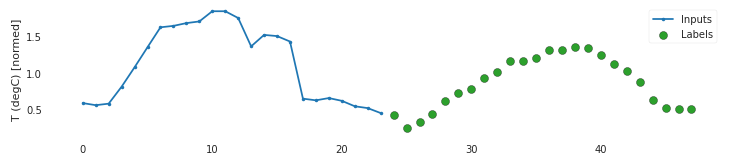

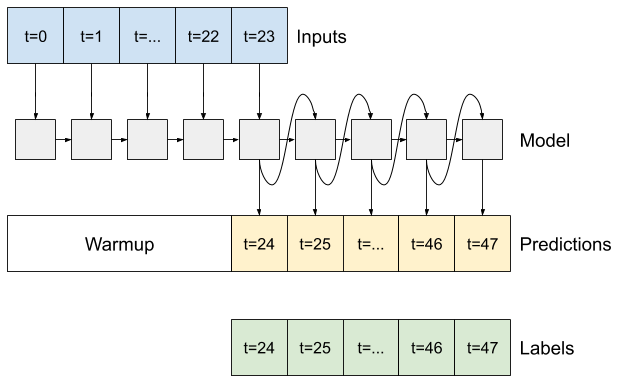

#Task [10 points]

Use two RNN models (one with simple vanilla RNN cells and the other with LSTM cells) to predict the temperature 24 hours into the future given the past 24 hours as illustrated in the below window: 

https://keras.io/api/layers/recurrent_layers/simple_rnn/

https://keras.io/api/layers/recurrent_layers/lstm/

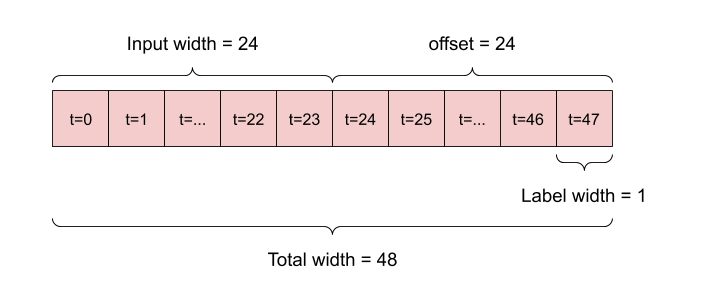

- In this task you're required to split the data into training, validation and test. Use the test set to test the generalization error of your models. 
- Use mean absolute error as an evaluation metric
- Compare the performance of the two models and comment on the results


##Split the data

In [ ]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

In [ ]:
split_fraction = 0.85
train_test_split = int(split_fraction * int(df.shape[0]))
print("Train + val split: ", train_test_split)
step = 6
past = 6*24
future = 6*24
learning_rate = 0.001
batch_size = 256
epochs = 10

features = normalize(features.values, train_val_split)
features = pd.DataFrame(features)
features.head()

Train + val split:  357468


,0,1,2,3,4,5,6,7
0,0.947814,-1.979207,-1.303152,-0.784423,-1.487312,2.215937,-0.158351,0.559788
1,0.953841,-2.024273,-1.316152,-0.786500,-1.506027,2.265992,0.037183,0.572909
2,0.949020,-2.035829,-1.318752,-0.788577,-1.509770,2.276735,0.201721,0.270589
3,0.946609,-2.012718,-1.312252,-0.790654,-1.494798,2.251098,0.134382,0.185424
4,0.946609,-2.008096,-1.310952,-0.790654,-1.494798,2.246458,0.163729,0.137166


### Splitting the data into train and test

In [ ]:
train_val_data = features.loc[0 : train_test_split - 1]
test_data = features.loc[train_test_split:]

print("Train + val data shape: ", train_val_data.shape)
print("Test data shape: ", test_data.shape)

Train + val data shape:  (357468, 8)
Test data shape:  (63083, 8)


### Splitting the training data into train and validation

In [ ]:
split_fraction = 0.8236
train_val_split = int(split_fraction * int(train_val_data.shape[0]))

train_data = train_val_data.loc[0 : train_val_split - 1]
val_data = train_val_data.loc[train_val_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)
print("Test data shape: ", test_data.shape)

Train data shape:  (294410, 8)
Validation data shape:  (63058, 8)
Test data shape:  (63083, 8)


In [ ]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  288
End=  294698
(294410, 8)
(294410, 1)
Sequence length=  24


##Training data

In [ ]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

##Validation data

In [ ]:
label_start = train_val_split + past + future

x_val = val_data.iloc[:].values
y_val = features.iloc[label_start: train_test_split + past + future][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 24, 8)
Target shape: (256, 1)


##Test data

We'll exclude the last 6 hours from the validation data because we don't have a label for them

In [ ]:
x_end = len(test_data) - past - future

label_start = train_test_split + past + future

x_test = test_data.iloc[:x_end].values
y_test = features.iloc[label_start:][[1]]

dataset_test = keras.preprocessing.timeseries_dataset_from_array(
    x_test,
    y_test,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 24, 8)
Target shape: (256, 1)


##Training

In [ ]:
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


### SimpleRNN

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
SimpleRNN_out = keras.layers.SimpleRNN(32)(inputs)
outputs = keras.layers.Dense(1)(SimpleRNN_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mae")
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
simple_rnn (SimpleRNN)       (None, 32)                1312      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 1,345
Trainable params: 1,345
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
1150/1150 [==============================] - 64s 55ms/step - loss: 0.3605 - val_loss: 0.3221

Epoch 00001: val_loss improved from inf to 0.32210, saving model to model_checkpoint.h5
Epoch 2/10
1150/1150 [==============================] - 65s 57ms/step - loss: 0.3157 - val_loss: 0.3132

Epoch 00002: val_loss improved from 0.32210 to 0.31320, saving model to model_checkpoint.h5
Epoch 3/10
1150/1150 [==============================] - 65s 56ms/step - loss: 0.3091 - val_loss: 0.3152

Epoch 00003: val_loss did not improve from 0.31320
Epoch 4/10
1150/1150 [==============================] - 63s 55ms/step - loss: 0.3051 - val_loss: 0.3166

Epoch 00004: val_loss did not improve from 0.31320
Epoch 5/10
1150/1150 [==============================] - 63s 55ms/step - loss: 0.3029 - val_loss: 0.3253

Epoch 00005: val_loss did not improve from 0.31320
Epoch 6/10
1150/1150 [==============================] - 62s 54ms/step - loss: 0.3014 - val_loss: 0.3292

Epoch 00006: val_loss did not improve

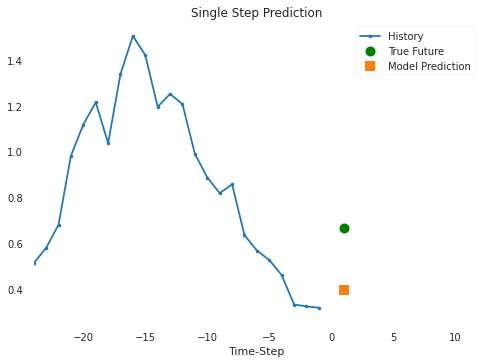

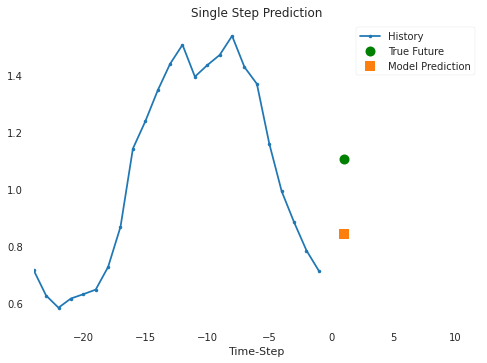

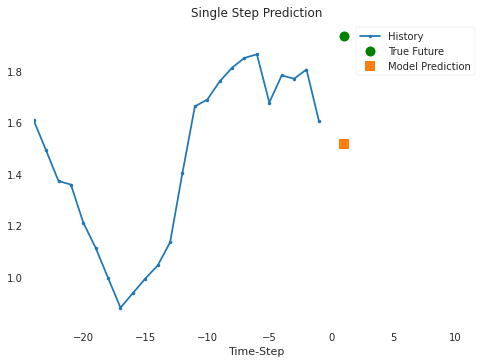

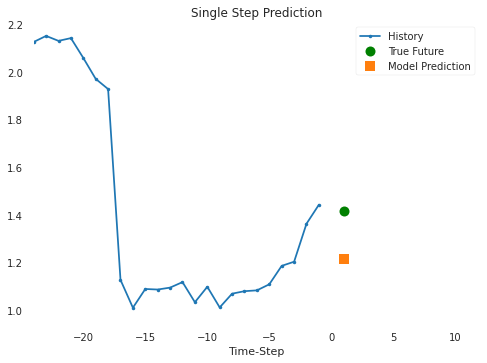

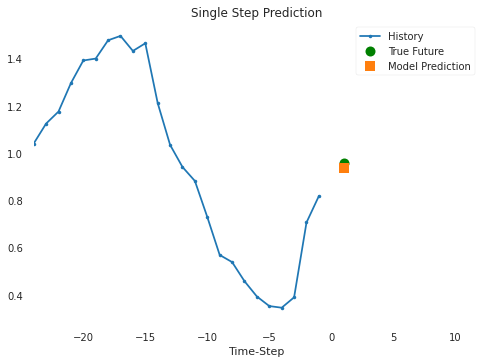

In [ ]:
for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [ ]:
model.evaluate(dataset_test)

245/245 [==============================] - 9s 38ms/step - loss: 0.3191


0.3191259205341339

### LSTM

In [ ]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mae")
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 32)                5248      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33        
Total params: 5,281
Trainable params: 5,281
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
1150/1150 [==============================] - 79s 65ms/step - loss: 0.4867 - val_loss: 0.3195

Epoch 00001: val_loss improved from inf to 0.31948, saving model to model_checkpoint.h5
Epoch 2/10
1150/1150 [==============================] - 76s 66ms/step - loss: 0.3106 - val_loss: 0.3142

Epoch 00002: val_loss improved from 0.31948 to 0.31420, saving model to model_checkpoint.h5
Epoch 3/10
1150/1150 [==============================] - 76s 66ms/step - loss: 0.3043 - val_loss: 0.3084

Epoch 00003: val_loss improved from 0.31420 to 0.30839, saving model to model_checkpoint.h5
Epoch 4/10
1150/1150 [==============================] - 80s 69ms/step - loss: 0.3013 - val_loss: 0.3006

Epoch 00004: val_loss improved from 0.30839 to 0.30062, saving model to model_checkpoint.h5
Epoch 5/10
1150/1150 [==============================] - 81s 70ms/step - loss: 0.2978 - val_loss: 0.2955

Epoch 00005: val_loss improved from 0.30062 to 0.29552, saving model to model_checkpoint.h5
Epoch 6/10
1150/115

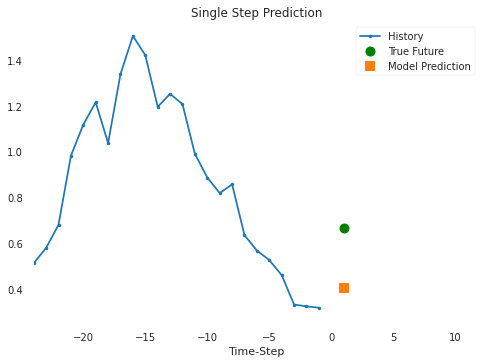

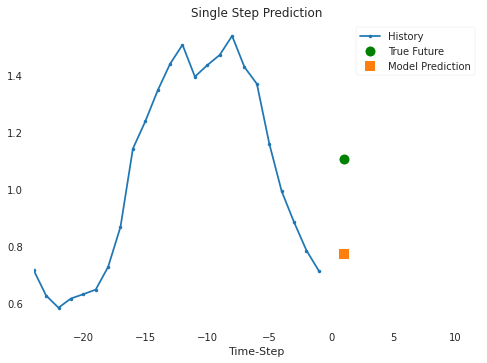

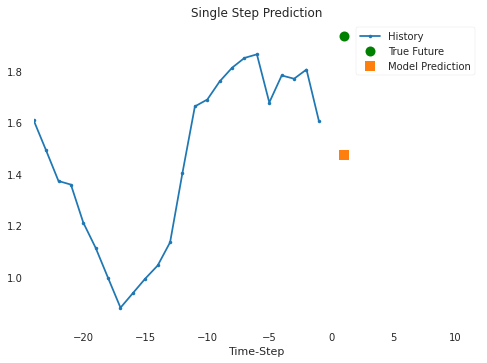

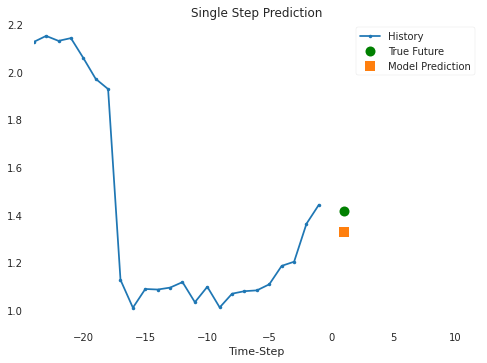

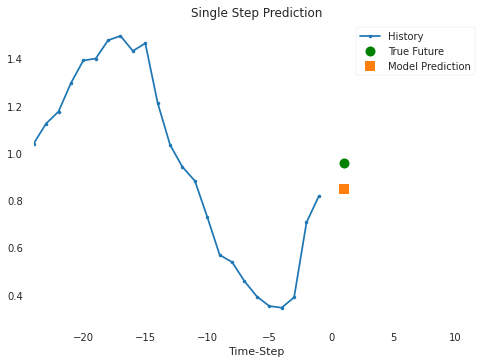

In [ ]:
for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [ ]:
model.evaluate(dataset_test)

245/245 [==============================] - 12s 50ms/step - loss: 0.2759


0.275850385427475

## Comparison


LSTM performed better than SimpleRNN on the test data => better generalization

##Bonus[1 point]
- What does the return_sequences parameter mean in LSTM layer?  

It tells it whether to return the full sequence, or the last output in the sequence only. So, we can retrieve the hidden state output, for each input timestep, by setting the parameter = True.